# Navier-Stokes (2D Vorticity)

Mapping: $\text{curl}(f) \to \omega$ where $\omega$ is the vorticity field satisfying the 2-D Navier-Stokes equations
$$\partial_t \omega + (\mathbf{u}\cdot\nabla)\omega = \nu\,\Delta\omega + f.$$

**Data**: two separate `.npy` files — input (curl of forcing) and output (vorticity), shape `(x, y, n)` permuted to `(n, y, x)`.

In [1]:
import sys, os
sys.path.insert(0, os.path.join(os.getcwd(), '..'))

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import HTML

plt.rcParams.update({'figure.dpi': 120, 'font.size': 11, 'axes.titlesize': 13})

INPUT_PATH  = '/DATA/Sawan_projects/research/DATA/1nu0_005_Random_NS_curl_f_100.npy'
OUTPUT_PATH = '/DATA/Sawan_projects/research/DATA/1nu0_005_Random_NS_omega_100.npy'

In [2]:
raw_input  = np.load(INPUT_PATH)   # (x, y, n)
raw_output = np.load(OUTPUT_PATH)  # (x, y, n)

# Permute to (n, y, x)
curl_f = raw_input.transpose(2, 1, 0).astype(np.float32)
omega  = raw_output.transpose(2, 1, 0).astype(np.float32)

print(f'curl_f: shape={curl_f.shape}, dtype={curl_f.dtype}')
print(f'omega:  shape={omega.shape},  dtype={omega.dtype}')
print(f'\ncurl_f range: [{curl_f.min():.4f}, {curl_f.max():.4f}], mean: {curl_f.mean():.4f}')
print(f'omega  range: [{omega.min():.4f}, {omega.max():.4f}], mean: {omega.mean():.4f}')

N = curl_f.shape[0]
print(f'\nTotal samples: {N}')

curl_f: shape=(5000, 256, 256), dtype=float32
omega:  shape=(5000, 256, 256),  dtype=float32

curl_f range: [-0.0283, 0.0279], mean: 0.0000
omega  range: [-0.2547, 0.2464], mean: 0.0000

Total samples: 5000


## Sample Vorticity Contour Plots

In [ ]:
def plot_contour_pair(curl, omg, idx, axes):
    """Plot a single curl_f/omega pair as filled contours."""
    for arr, ax, title, cmap in [
        (curl[idx], axes[0], f'curl(f) (sample {idx})', 'RdBu_r'),
        (omg[idx],  axes[1], f'$\\omega$ (sample {idx})', 'RdBu_r'),
    ]:
        im = ax.imshow(arr, cmap=cmap, origin='lower', extent=[0,1,0,1])
        ax.set_title(title)
        divider = make_axes_locatable(ax)
        plt.colorbar(im, cax=divider.append_axes('right', size='5%', pad=0.05))

rng = np.random.default_rng(42)
idxs = rng.choice(N, 4, replace=False)

fig, axes = plt.subplots(4, 2, figsize=(8, 14))
for row, idx in enumerate(idxs):
    plot_contour_pair(curl_f, omega, idx, axes[row])
fig.suptitle('Training samples: curl$(f)$ $\\to$ vorticity $\\omega$', fontsize=14, y=1.01)
fig.tight_layout()
plt.show()

## Pointwise Statistics

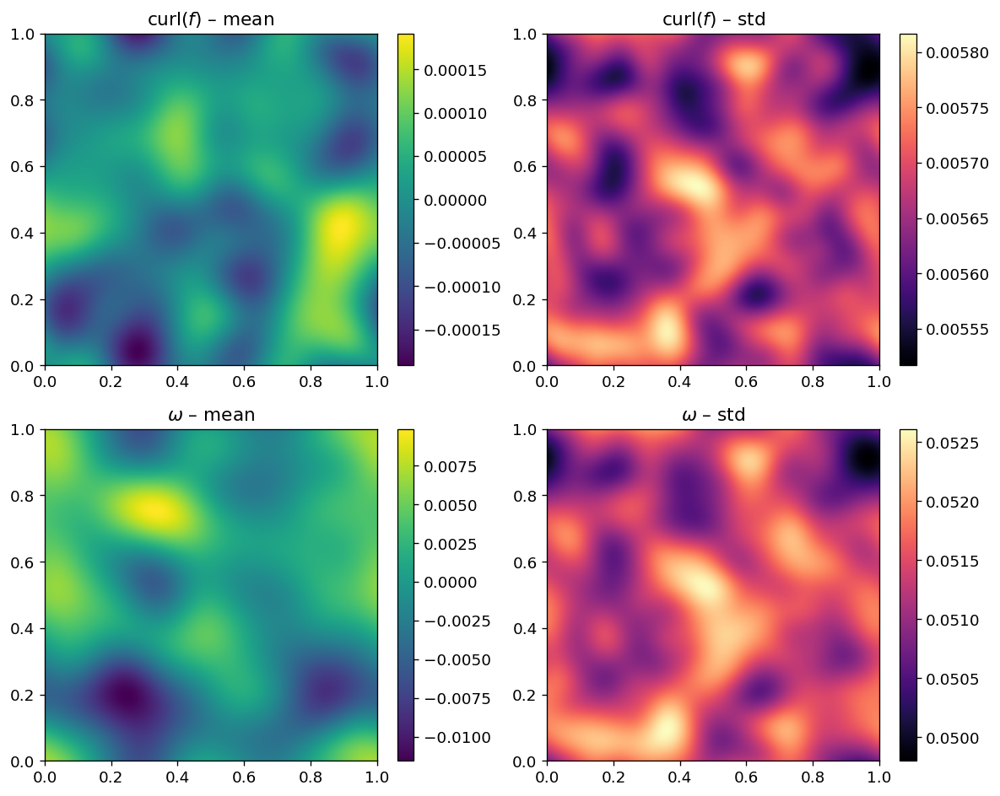

In [4]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
for row, (arr, name) in enumerate([(curl_f, 'curl$(f)$'), (omega, '$\\omega$')]):
    mu = arr.mean(axis=0)
    sd = arr.std(axis=0)
    for col, (field, label, cmap) in enumerate([
        (mu, f'{name} \u2013 mean', 'viridis'),
        (sd, f'{name} \u2013 std', 'magma'),
    ]):
        im = axes[row, col].imshow(field, cmap=cmap, origin='lower', extent=[0,1,0,1])
        axes[row, col].set_title(label)
        plt.colorbar(im, ax=axes[row, col], fraction=0.046)
fig.tight_layout()
plt.show()

## Value Distributions

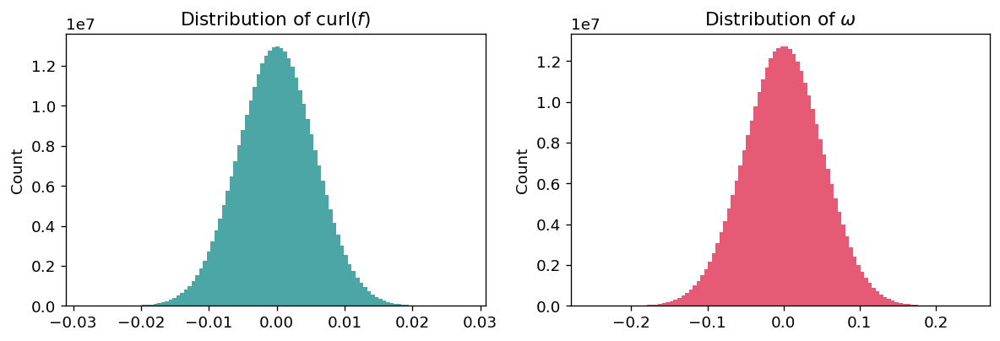

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))
axes[0].hist(curl_f.ravel(), bins=100, color='teal', alpha=0.7)
axes[0].set_title('Distribution of curl$(f)$')
axes[1].hist(omega.ravel(), bins=100, color='crimson', alpha=0.7)
axes[1].set_title('Distribution of $\\omega$')
for ax in axes: ax.set_ylabel('Count')
fig.tight_layout()
plt.show()

## 2-D Spectral Energy

In [ ]:
c_fft = np.abs(np.fft.fft2(curl_f)).mean(axis=0)
o_fft = np.abs(np.fft.fft2(omega)).mean(axis=0)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for arr, ax, title in [(c_fft, axes[0], 'curl$(f)$'), (o_fft, axes[1], '$\\omega$')]:
    shifted = np.fft.fftshift(np.log1p(arr))
    im = ax.imshow(shifted, cmap='inferno', origin='lower')
    ax.set_title(f'Log spectral energy \u2013 {title}')
    plt.colorbar(im, ax=ax, fraction=0.046)
fig.tight_layout()
plt.show()

## Animation: Scrolling Through Vorticity Fields

In [7]:
n_anim = 40
anim_idxs = rng.choice(N, n_anim, replace=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))
im1 = ax1.imshow(curl_f[anim_idxs[0]], cmap='RdBu_r', origin='lower', extent=[0,1,0,1])
im2 = ax2.imshow(omega[anim_idxs[0]],  cmap='RdBu_r', origin='lower', extent=[0,1,0,1])
ax1.set_title('curl$(f)$'); ax2.set_title('$\\omega$')
plt.colorbar(im1, ax=ax1, fraction=0.046)
plt.colorbar(im2, ax=ax2, fraction=0.046)
title = fig.suptitle(f'Sample {anim_idxs[0]}')

vmin_c, vmax_c = curl_f.min(), curl_f.max()
vmin_o, vmax_o = omega.min(), omega.max()
im1.set_clim(vmin_c, vmax_c)
im2.set_clim(vmin_o, vmax_o)

def _update(frame):
    idx = anim_idxs[frame]
    im1.set_data(curl_f[idx])
    im2.set_data(omega[idx])
    title.set_text(f'Sample {idx}')
    return im1, im2, title

ani = animation.FuncAnimation(fig, _update, frames=n_anim, interval=350, blit=True)
plt.close(fig)
HTML(ani.to_jshtml())